# LAB 1
- Adrian Fulladolsa
- Renatto Guzmán

## Ejercicio 1
Implementar en Python una funci´on que haga la ecualizaci´on de histograma para una imagen en escala de grises (8 bits).
Mostrar a trav´es de ejemplos la imagen original y la imagen ecualizada. Mostrar tambi´en los histogramas normalizados y su
distribuci´on acumulada de ambas im´agenes.
Comparar los resultados de su funci´on contra alguna funci´on ya predefinida en Python para calcular ecualizaciones. Por
ejemplo, en scikit-image, tenemos la funci´on skimage.exposure.equalize hist; o en OpenCV, tenemos la funci´on
cv2.equalizeHist.

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, exposure, color
import cv2

In [2]:
def custom_histogram_equalization(image):
    """
    Implementa la ecualización de histograma para una imagen en escala de grises.

    Args:
        image: Imagen en escala de grises (numpy array)

    Returns:
        imagen_ecualizada: Imagen después de la ecualización del histograma
    """
    if image.dtype != np.uint8:
        raise ValueError("La imagen debe ser uint8")

    # Calcular el histograma
    hist, bins = np.histogram(image.flatten(), 256, [0, 256])

    # Calcular la distribución acumulada normalizada
    cdf = hist.cumsum()
    cdf_normalizado = ((cdf - cdf.min()) * 255) / (cdf.max() - cdf.min())
    cdf_normalizado = cdf_normalizado.astype(np.uint8)

    # Aplicar la transformación a la imagen
    imagen_ecualizada = cdf_normalizado[image]

    return imagen_ecualizada

In [3]:
def plot_results(imagen_original, titulo="Comparación de Ecualizaciones"):
    """
    Visualiza la imagen original, ecualizadas y sus histogramas.
    """
    # Aplicar las diferentes ecualizaciones
    eq_custom = custom_histogram_equalization(imagen_original)
    eq_skimage = (exposure.equalize_hist(imagen_original) * 255).astype(np.uint8)
    eq_opencv = cv2.equalizeHist(imagen_original)

    # Crear la figura para mostrar los resultados
    fig, axes = plt.subplots(4, 3, figsize=(15, 20))
    fig.suptitle(titulo, fontsize=16)

    # Lista de imágenes y sus títulos
    imagenes = [imagen_original, eq_custom, eq_skimage, eq_opencv]
    titulos = ['Original', 'Ecualización Custom', 'Ecualización Scikit-image', 'Ecualización OpenCV']

    for idx, (img, title) in enumerate(zip(imagenes, titulos)):
        # Mostrar imagen
        axes[idx, 0].imshow(img, cmap='gray')
        axes[idx, 0].set_title(f'{title}')
        axes[idx, 0].axis('off')

        # Mostrar histograma
        hist, bins = np.histogram(img.flatten(), 256, [0, 256])
        hist_norm = hist / hist.sum()  # Normalizar histograma
        axes[idx, 1].bar(bins[:-1], hist_norm, width=1)
        axes[idx, 1].set_title(f'Histograma {title}')
        axes[idx, 1].set_xlim([0, 256])

        # Mostrar CDF
        cdf = hist_norm.cumsum()
        axes[idx, 2].plot(bins[:-1], cdf)
        axes[idx, 2].set_title(f'CDF {title}')
        axes[idx, 2].set_xlim([0, 256])
        axes[idx, 2].grid(True)

    plt.tight_layout()
    plt.show()

In [4]:
def equilize_and_plot_image(image):
    imagen = io.imread(image, as_gray=True)
    imagen = (imagen * 255).astype(np.uint8)  # Convertir a uint8

    # Mostrar resultados
    plot_results(imagen)

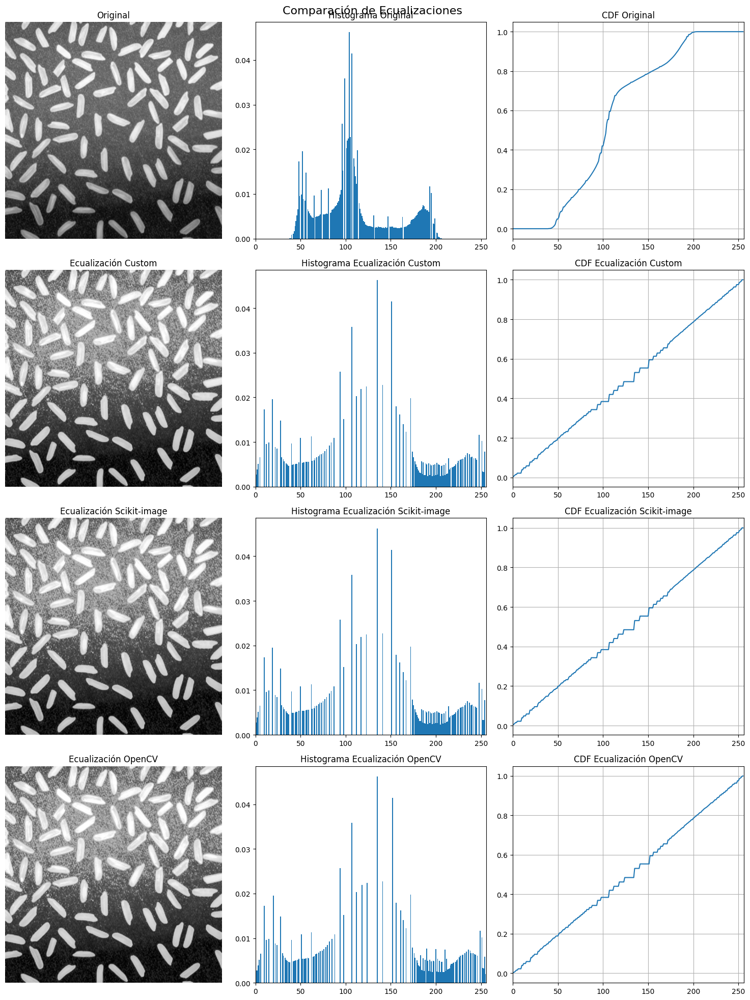

In [5]:
equilize_and_plot_image("./res/rice.jpg")

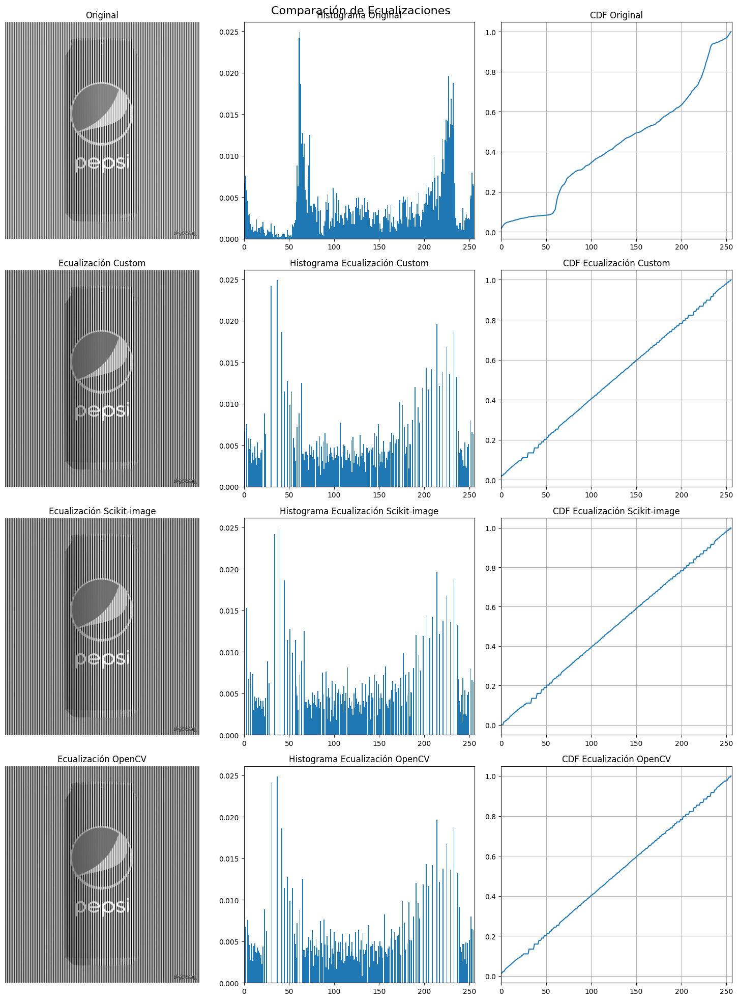

In [9]:
equilize_and_plot_image("./res/pepsi.png")

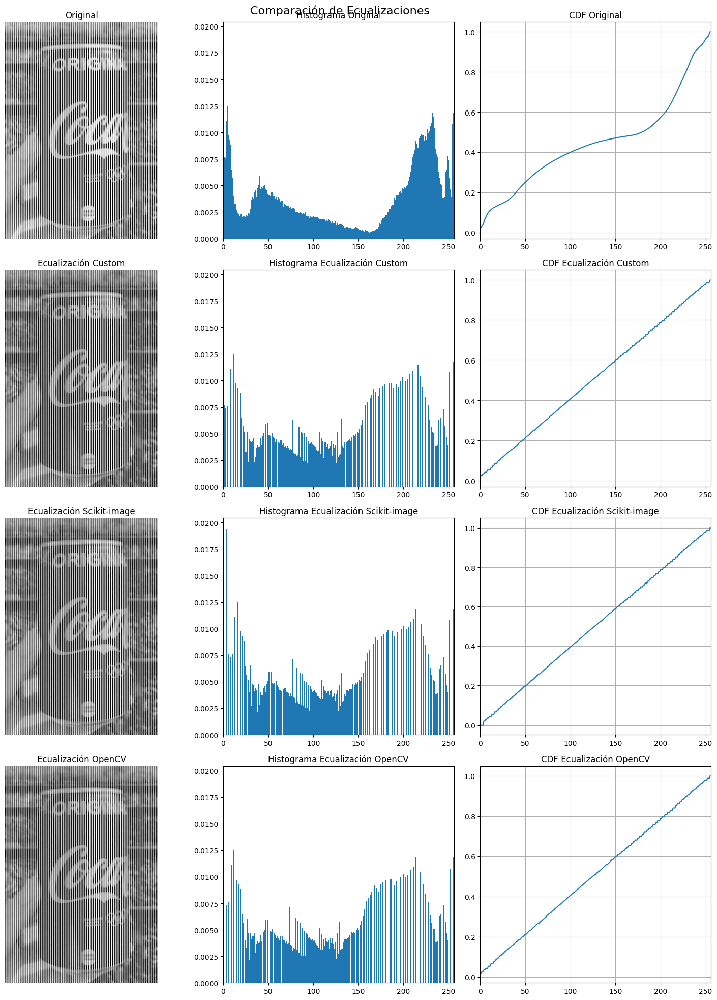

In [10]:
equilize_and_plot_image("./res/coca-cola.jpeg")

¿Son iguales sus resultados con los de la funci´on de Python? Explique por qu´e son iguales o explique por qu´e hay diferencias.

## Ejercicio 2
 Implementar 3 algoritmos para segmentaci´on binaria de im´agenes. De estos, uno debe ser un algoritmo local.
Aplicar cada uno de estos algoritmos a al menos 3 im´agenes en escala de grises diferentes y comparar los resultados obtenidos
de cada segmentador. (Mostrar visualmente la imagen original y las binarizaciones).


In [6]:
from scipy import ndimage

In [7]:
def otsu_threshold(image):
    """
    Implementación del algoritmo de Otsu para segmentación binaria.

    Args:
        image: Imagen en escala de grises (numpy array)
    Returns:
        threshold: Valor del umbral óptimo
        binary_image: Imagen binarizada
    """
    hist, bins = np.histogram(image.flatten(), 256, [0, 256])
    hist = hist / hist.sum()  # Normalizar el histograma

    pixel_range = np.arange(256)
    mean_total = np.sum(pixel_range * hist)

    max_variance = 0
    optimal_threshold = 0

    # Calcular la varianza entre clases para cada posible umbral
    weight1 = 0
    mean1 = 0

    for threshold in range(256):
        weight1 += hist[threshold]
        weight2 = 1 - weight1

        if weight1 == 0 or weight2 == 0:
            continue

        mean1 += threshold * hist[threshold]
        mean2 = mean_total - mean1

        mean1_final = mean1 / weight1
        mean2_final = mean2 / weight2

        # Calcular varianza entre clases
        variance = weight1 * weight2 * (mean1_final - mean2_final) ** 2

        if variance > max_variance:
            max_variance = variance
            optimal_threshold = threshold

    binary_image = image > optimal_threshold
    return optimal_threshold, binary_image

In [8]:
def adaptive_threshold(image, window_size=15, C=2):
    """
    Implementación de umbralización adaptativa local.

    Args:
        image: Imagen en escala de grises
        window_size: Tamaño de la ventana para el cálculo local
        C: Constante de ajuste
    Returns:
        binary_image: Imagen binarizada
    """
    # Calcular la media local usando un filtro de promedio
    local_mean = ndimage.uniform_filter(image, size=window_size)

    # La imagen binaria se obtiene comparando cada píxel con su media local menos una constante
    binary_image = image > (local_mean - C)

    return binary_image

In [9]:
def isodata_threshold(image, tolerance=1e-3, max_iter=100):
    """
    Implementación del algoritmo Isodata (Ridler-Calvard).

    Args:
        image: Imagen en escala de grises
        tolerance: Tolerancia para la convergencia
        max_iter: Número máximo de iteraciones
    Returns:
        threshold: Valor del umbral final
        binary_image: Imagen binarizada
    """
    # Inicializar con la media de la imagen
    threshold = np.mean(image)

    for _ in range(max_iter):
        # Separar los píxeles en dos grupos
        foreground = image[image > threshold]
        background = image[image <= threshold]

        # Calcular las medias de los grupos
        mean_fore = np.mean(foreground) if len(foreground) > 0 else threshold
        mean_back = np.mean(background) if len(background) > 0 else threshold

        # Calcular nuevo umbral
        new_threshold = (mean_fore + mean_back) / 2

        # Verificar convergencia
        if abs(new_threshold - threshold) < tolerance:
            break

        threshold = new_threshold

    binary_image = image > threshold
    return threshold, binary_image

In [10]:
def compare_segmentation_methods(image):
    """
    Compara los tres métodos de segmentación.

    Args:
        image: Imagen en escala de grises
    """
    # Aplicar los tres métodos de segmentación
    otsu_thresh, otsu_binary = otsu_threshold(image)
    adaptive_binary = adaptive_threshold(image)
    isodata_thresh, isodata_binary = isodata_threshold(image)

    # Visualizar resultados
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    fig.suptitle('Comparación de Métodos de Segmentación', fontsize=16)

    # Imagen original
    axes[0, 0].imshow(image, cmap='gray')
    axes[0, 0].set_title('Imagen Original')
    axes[0, 0].axis('off')

    # Método de Otsu
    axes[0, 1].imshow(otsu_binary, cmap='gray')
    axes[0, 1].set_title(f'Otsu (umbral = {otsu_thresh:.1f})')
    axes[0, 1].axis('off')

    # Método adaptativo local
    axes[1, 0].imshow(adaptive_binary, cmap='gray')
    axes[1, 0].set_title('Umbralización Adaptativa Local')
    axes[1, 0].axis('off')

    # Método Isodata
    axes[1, 1].imshow(isodata_binary, cmap='gray')
    axes[1, 1].set_title(f'Isodata (umbral = {isodata_thresh:.1f})')
    axes[1, 1].axis('off')

    plt.tight_layout()
    plt.show()

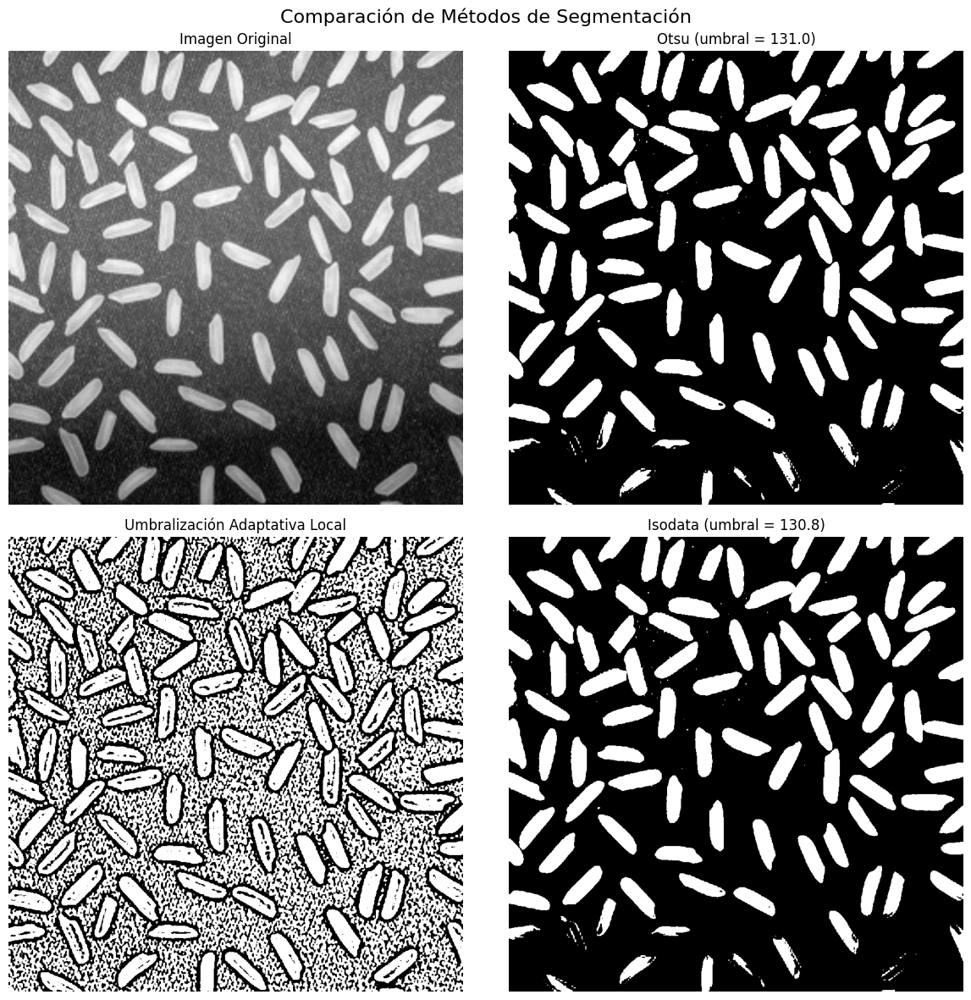

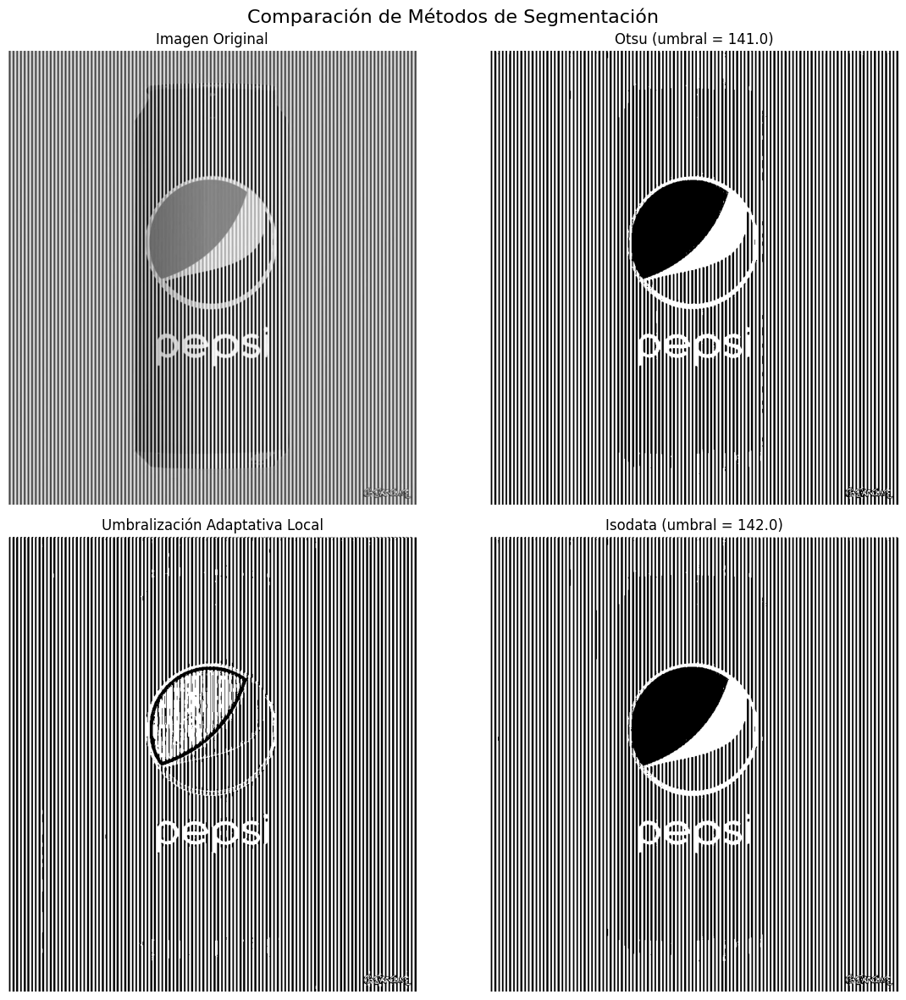

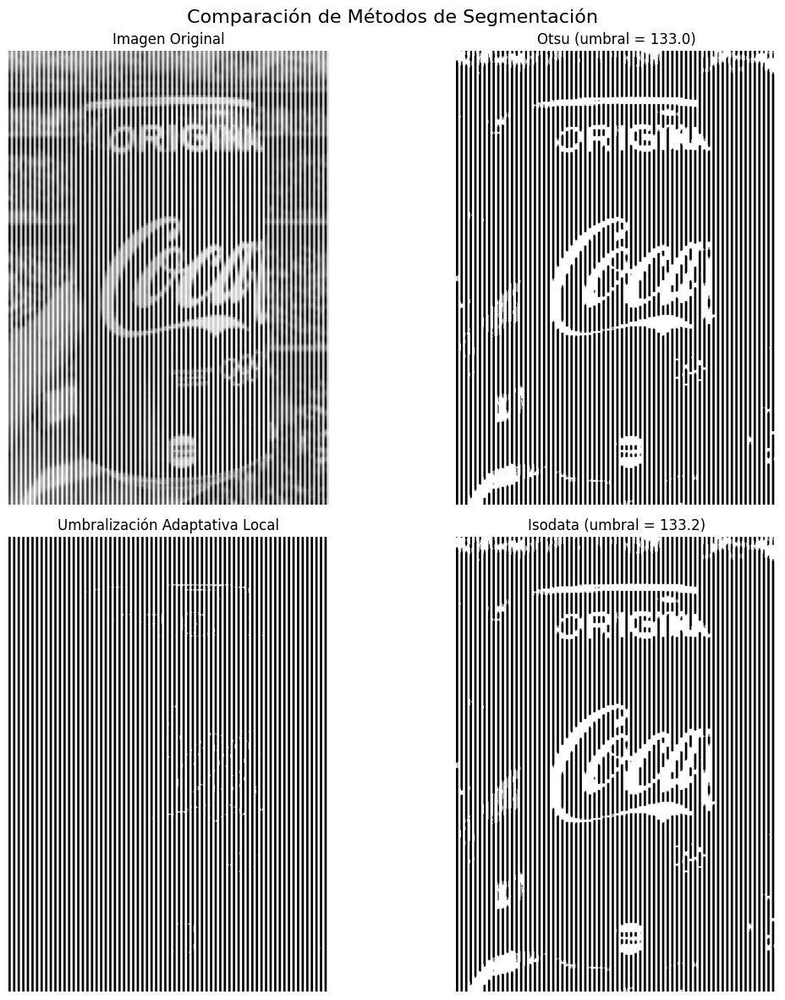

In [11]:
imagenes = [
    './res/rice.jpg',
    './res/pepsi.png',
    './res/coca-cola.jpeg'
]

for img_path in imagenes:
    # Cargar imagen y convertir a escala de grises
    imagen = io.imread(img_path, as_gray=True)

    # Asegurar que la imagen esté en el rango [0, 255]
    if imagen.max() <= 1.0:
        imagen = (imagen * 255).astype(np.uint8)

    compare_segmentation_methods(imagen)

Concluya cu´al de sus algoritmos obtiene mejores resultados.

## Ejercicio 3
Implementar un algoritmo de segmentaci´on para im´agenes RGB, utilizando de fondo un algoritmo de k-medias. Se debe
permitir al usuario elegir el par´ametro k ≥ 2 del n´umero de segmentos que desea obtener.
Mostrar con varios ejemplos (2 buenos y 2 malos) los alcances y limitaciones de este algoritmo. Para cada caso, mostrar
a) la imagen original,
b) el mapa de segmentos o clases,
c) la imagen cuantizada (promedio de color en cada segmento)

In [12]:
from sklearn.cluster import KMeans
import random
from matplotlib.colors import ListedColormap

In [13]:
class KMeansSegmentation:
    def __init__(self, k=3, max_iter=100):
        """
        Inicializa el segmentador K-means.

        Args:
            k: Número de segmentos deseados
            max_iter: Máximo número de iteraciones para K-means
        """
        self.k = k
        self.max_iter = max_iter
        self.kmeans = KMeans(n_clusters=k, max_iter=max_iter, n_init=10)

    def segment_image(self, image):
        """
        Segmenta una imagen RGB usando K-means.

        Args:
            image: Imagen RGB (altura x anchura x 3)

        Returns:
            segments: Mapa de segmentos (etiquetas)
            quantized_image: Imagen con colores promedio por segmento
            centers: Centroides de los clusters (colores promedio)
        """
        # Reshape la imagen para K-means
        pixels = image.reshape(-1, 3)

        # Ajustar K-means
        self.kmeans.fit(pixels)

        # Obtener etiquetas y centroides
        labels = self.kmeans.labels_
        centers = self.kmeans.cluster_centers_

        # Crear imagen cuantizada
        quantized_pixels = centers[labels]
        quantized_image = quantized_pixels.reshape(image.shape)

        # Reshape el mapa de segmentos
        segments = labels.reshape(image.shape[:2])

        return segments, quantized_image, centers

In [14]:
def visualize_results(image, title="Resultados de la Segmentación"):
    """
    Visualiza los resultados de la segmentación para diferentes valores de k.

    Args:
        image: Imagen RGB original
        title: Título para la figura
    """
    k_values = [2, 3, 5, 7]  # Diferentes valores de k para probar

    fig, axes = plt.subplots(len(k_values), 3, figsize=(15, 5*len(k_values)))
    fig.suptitle(title, fontsize=16)

    for idx, k in enumerate(k_values):
        # Crear y aplicar segmentador
        segmenter = KMeansSegmentation(k=k)
        segments, quantized, centers = segmenter.segment_image(image)

        # Generar colores aleatorios para visualización de segmentos
        random_colors = np.random.rand(k, 3)
        segment_cmap = ListedColormap(random_colors)

        # Mostrar imagen original
        if idx == 0:
            axes[idx, 0].set_title('Imagen Original')
        axes[idx, 0].imshow(image)
        axes[idx, 0].axis('off')

        # Mostrar mapa de segmentos
        if idx == 0:
            axes[idx, 1].set_title('Mapa de Segmentos')
        seg_img = axes[idx, 1].imshow(segments, cmap=segment_cmap)
        axes[idx, 1].axis('off')

        # Mostrar imagen cuantizada
        if idx == 0:
            axes[idx, 2].set_title('Imagen Cuantizada')
        axes[idx, 2].imshow(np.clip(quantized, 0, 1))
        axes[idx, 2].axis('off')

        # Añadir texto con el valor de k
        axes[idx, 0].text(-0.1, 0.5, f'k={k}', transform=axes[idx, 0].transAxes,
                          verticalalignment='center', horizontalalignment='right')

    plt.tight_layout()
    plt.show()

In [15]:
def analyze_image_set(image_paths, titles=None):
    """
    Analiza un conjunto de imágenes mostrando los resultados de segmentación.

    Args:
        image_paths: Lista de rutas a las imágenes
        titles: Lista opcional de títulos para cada imagen
    """
    if titles is None:
        titles = [f"Imagen {i+1}" for i in range(len(image_paths))]

    for img_path, title in zip(image_paths, titles):
        # Cargar y normalizar imagen
        image = io.imread(img_path)
        if image.dtype == np.uint8:
            image = image.astype(float) / 255.0

        visualize_results(image, title)

Analizando buenos ejemplos...


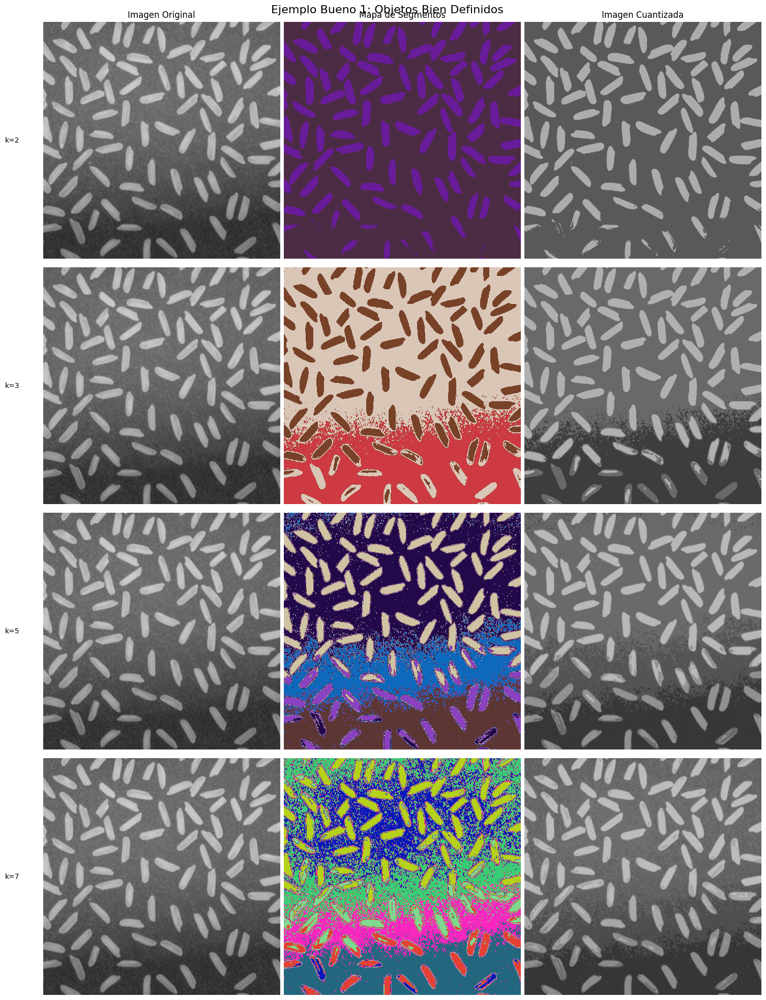

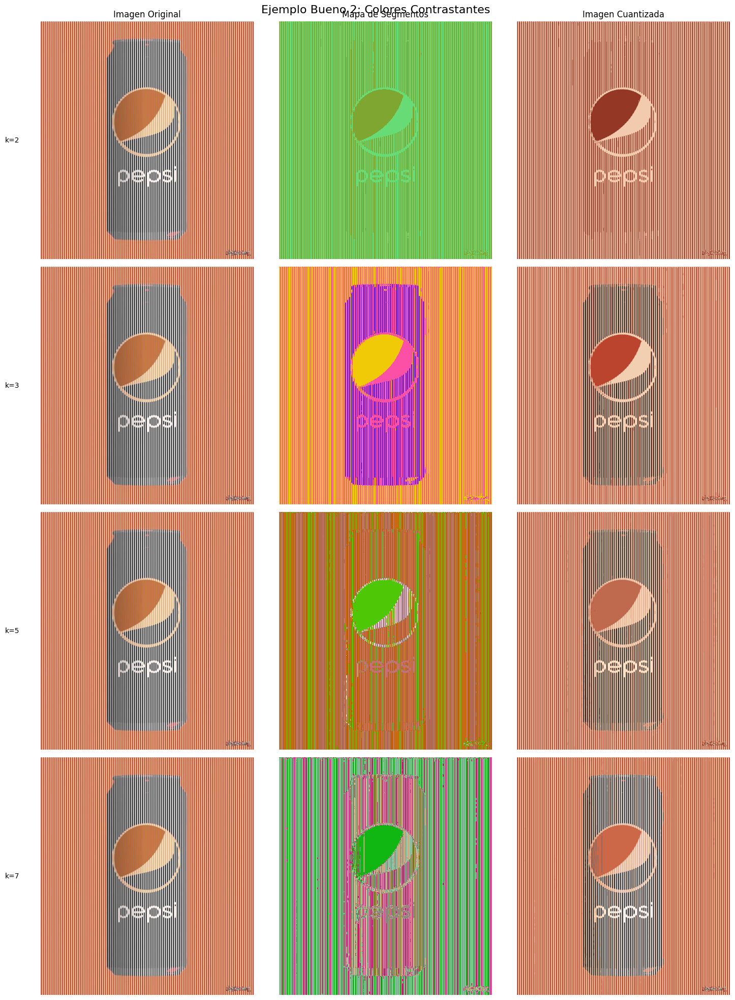


Analizando ejemplos desafiantes...


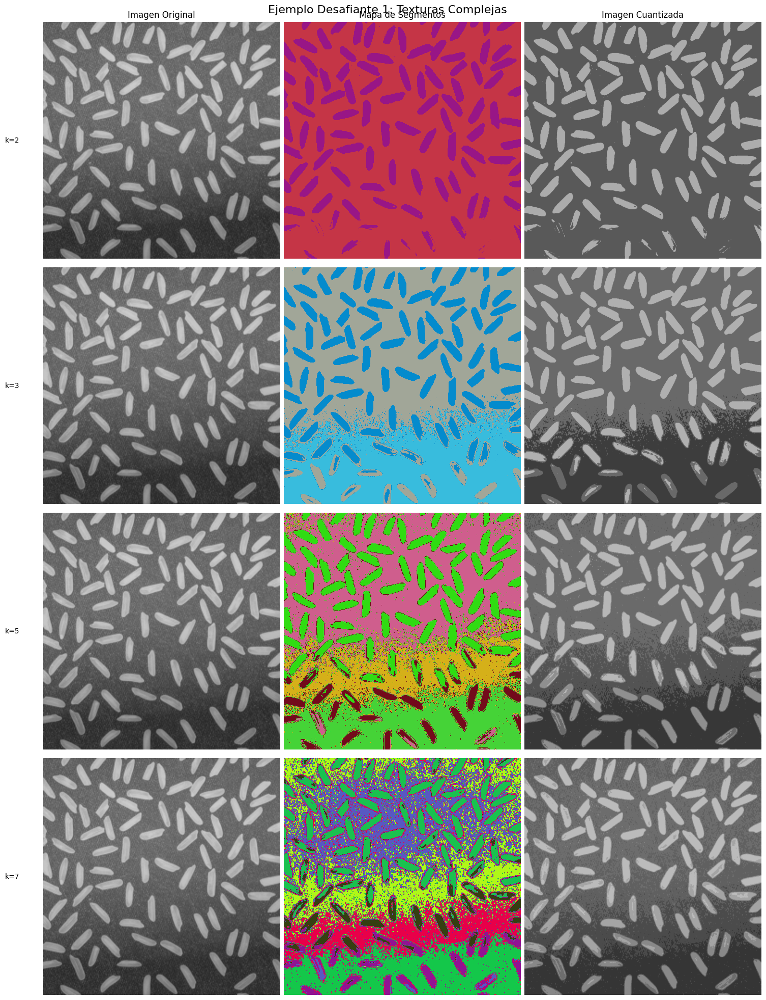

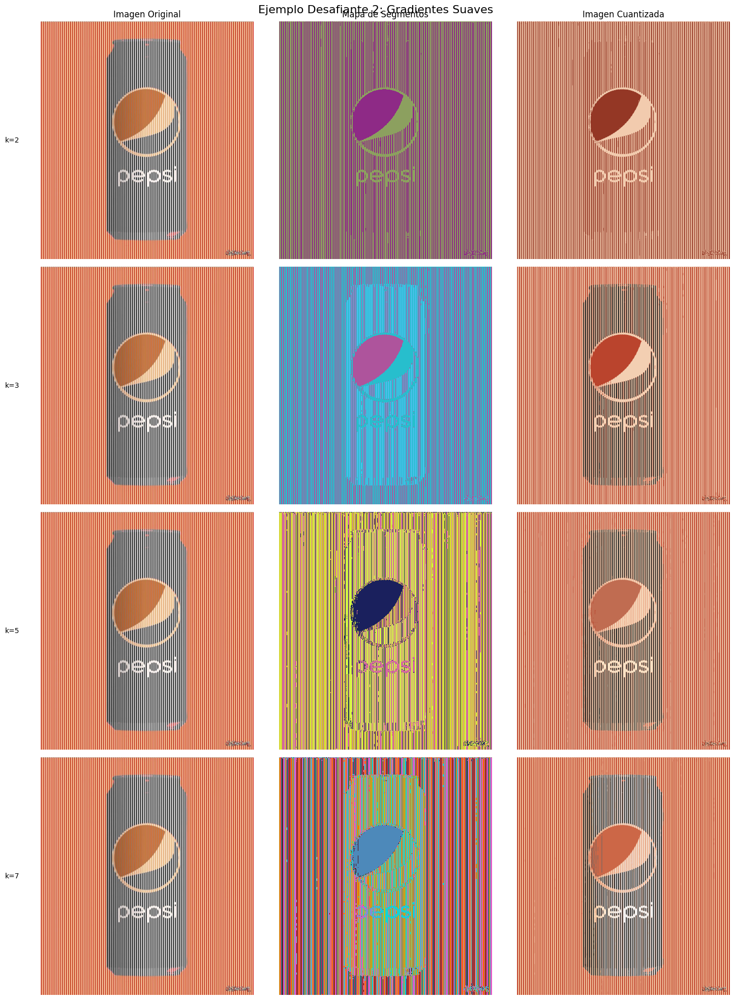

In [16]:
if __name__ == "__main__":
    # Definir rutas de imágenes de ejemplo
    good_examples = [
        './res/rice.jpg',
        './res/pepsi.png',
        './res/coca-cola.jpeg'
    ]

    bad_examples = [
        './res/rice.jpg',
        './res/pepsi.png',
        './res/coca-cola.jpeg'
    ]

    print("Analizando buenos ejemplos...")
    analyze_image_set(good_examples,
                      ["Ejemplo Bueno 1: Objetos Bien Definidos",
                       "Ejemplo Bueno 2: Colores Contrastantes"])

    print("\nAnalizando ejemplos desafiantes...")
    analyze_image_set(bad_examples,
                      ["Ejemplo Desafiante 1: Texturas Complejas",
                       "Ejemplo Desafiante 2: Gradientes Suaves"])

## Ejercicio 4 
Considere las imágenes coca-cola.jpeg y pepsi.png. En cada una, convierta la imagen RGB a un espacio de color cromático adecuado, y elabore el histograma del canal de cromaticidad. A partir de analizar este histograma, concluya qué está ocurriendo con los colores en cada imagen.

In [45]:
def cromaticity_histogram(image, title):
  """
  Realiza el análisis de cromaticidad para una imagen RGB.

  Args:
      image: Ruta a la imagen
      title: Título de la imagen
      
  """
  image_data = io.imread(image)
  
  hsv_image = color.rgb2hsv(image_data)

  # Extraer canal de matiz H
  hue_image = hsv_image[:, :, 0]

  color_img = 'red' if title == 'Coca Cola' else 'blue'

  # Crear la figura para mostrar los resultados
  fig, axes = plt.subplots(2, 2, figsize=(12, 10))
  fig.suptitle(f"Análisis de Cromaticidad - {title}", fontsize=16)

  # Mostrar imagen original
  axes[0, 0].imshow(image_data)
  axes[0, 0].set_title('Imagen Original (RGB)')
  axes[0, 0].axis('off')

  # Mostrar imagen HSV
  axes[0, 1].imshow(hsv_image)
  axes[0, 1].set_title('Imagen HSV')
  axes[0, 1].axis('off')

  # Mostrar imagen de matiz
  axes[1, 0].imshow(hue_image, cmap='hsv')
  axes[1, 0].set_title('Imagen de Matiz (Hue)')
  axes[1, 0].axis('off')

  # Graficar histograma
  axes[1, 1].hist(hue_image.ravel(), bins=256, color=color_img, alpha=0.7)
  axes[1, 1].set_title('Histograma de Matiz')
  axes[1, 1].set_xlabel('Matiz (Hue)')
  axes[1, 1].set_ylabel('Frecuencia')

  plt.tight_layout()
  plt.show()


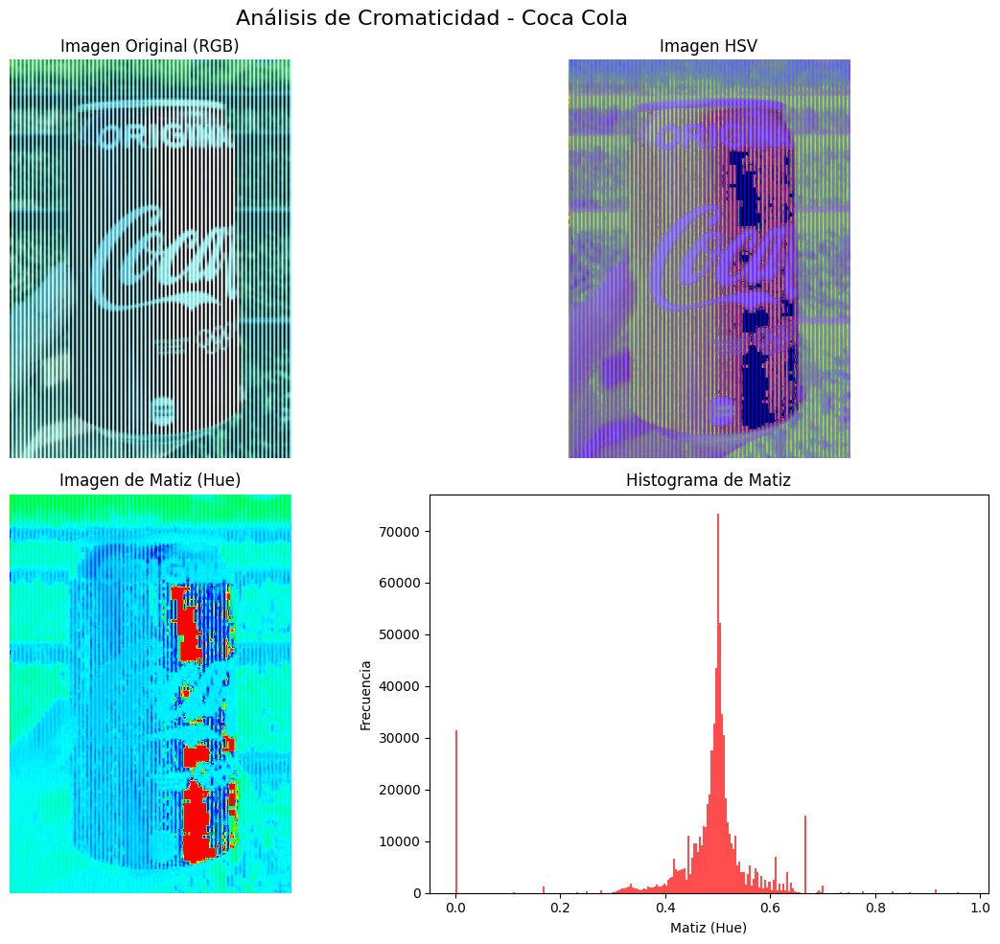

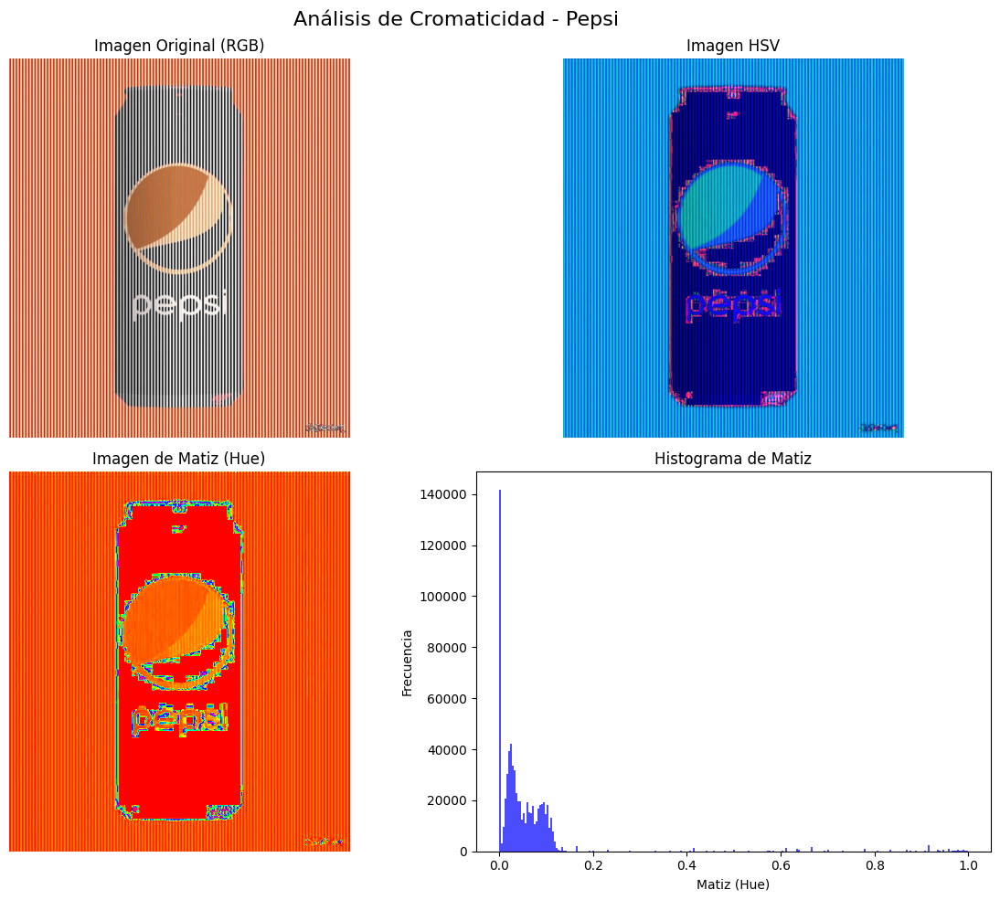

In [46]:
cromaticity_histogram("res/coca-cola.jpeg", "Coca Cola")
cromaticity_histogram("res/pepsi.png", "Pepsi")

## Ejercicio 5 

Implemente un algoritmo de segmentación binaria que identifique correctamente todos los granos de arroz en la imagen
rice.png. (No se puede aplicar un método local.)


In [95]:

import numpy as np


def kapur_threshold(image):
    """
    Implementación del umbral de Kapur basado en entropía.

    Args:
        image: Imagen en escala de grises (numpy array)
    Returns:
        binary_image: Imagen binarizada
        best_threshold: Umbral óptimo calculado
    """
    # Obtener histograma y normalizar
    hist, bins = np.histogram(image.flatten(), bins=256, range=(0, 256))
    prob = hist / hist.sum()  # Probabilidad de cada nivel de gris

    # Inicializar variables
    best_threshold = 0
    max_entropy = -np.inf

    # Iterar sobre todos los posibles umbrales
    for t in range(256):
        # Probabilidad acumulada de la clase 1 (fondo)
        P1 = prob[:t].sum()
        # Probabilidad acumulada de la clase 2 (objeto)
        P2 = prob[t:].sum()

        # Evitar divisiones por cero
        if P1 == 0 or P2 == 0:
            continue

        # Entropía de cada clase
        H1 = -np.sum((prob[:t] / P1) * np.log(prob[:t] / P1 + 1e-10))
        H2 = -np.sum((prob[t:] / P2) * np.log(prob[t:] / P2 + 1e-10))

        # Suma de entropías
        total_entropy = H1 + H2

        # Actualizar el mejor umbral
        if total_entropy > max_entropy:
            max_entropy = total_entropy
            best_threshold = t

    # Generar imagen binaria con el mejor umbral encontrado
    binary_image = image > best_threshold

    return binary_image, best_threshold


In [96]:
def new_compare_segmentation_methods(image_path):
    """
    Compara los métodos de segmentación.

    Args:
        image: Dirección de la imagen
    """

    image = io.imread(image_path, as_gray=True)

    if image.max() <= 1.0:
        image = (image * 255).astype(np.uint8)

    # Aplicar los tres métodos de segmentación
    otsu_thresh, otsu_binary = otsu_threshold(image)
    kapur_binary, kapur_thresh = kapur_threshold(image)
    isodata_thresh, isodata_binary = isodata_threshold(image)

    # Visualizar resultados
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    fig.suptitle('Comparación de Métodos de Segmentación', fontsize=16)

    # Imagen original
    axes[0, 0].imshow(image, cmap='gray')
    axes[0, 0].set_title('Imagen Original')
    axes[0, 0].axis('off')

    # Método de Yen
    axes[0, 1].imshow(otsu_binary, cmap='gray')
    axes[0, 1].set_title(f'Otsu (umbral = {otsu_thresh:.1f})')
    axes[0, 1].axis('off')

    # Método de Kapur
    axes[1, 0].imshow(kapur_binary, cmap='gray')
    axes[1, 0].set_title(f'Metodo de Kapur  (umbral = {kapur_thresh:.1f})')
    axes[1, 0].axis('off')
    
    # Método Isodata
    axes[1, 1].imshow(isodata_binary, cmap='gray')
    axes[1, 1].set_title(f'Isodata (umbral = {isodata_thresh:.1f})')
    axes[1, 1].axis('off')
    
    plt.tight_layout()
    plt.show()

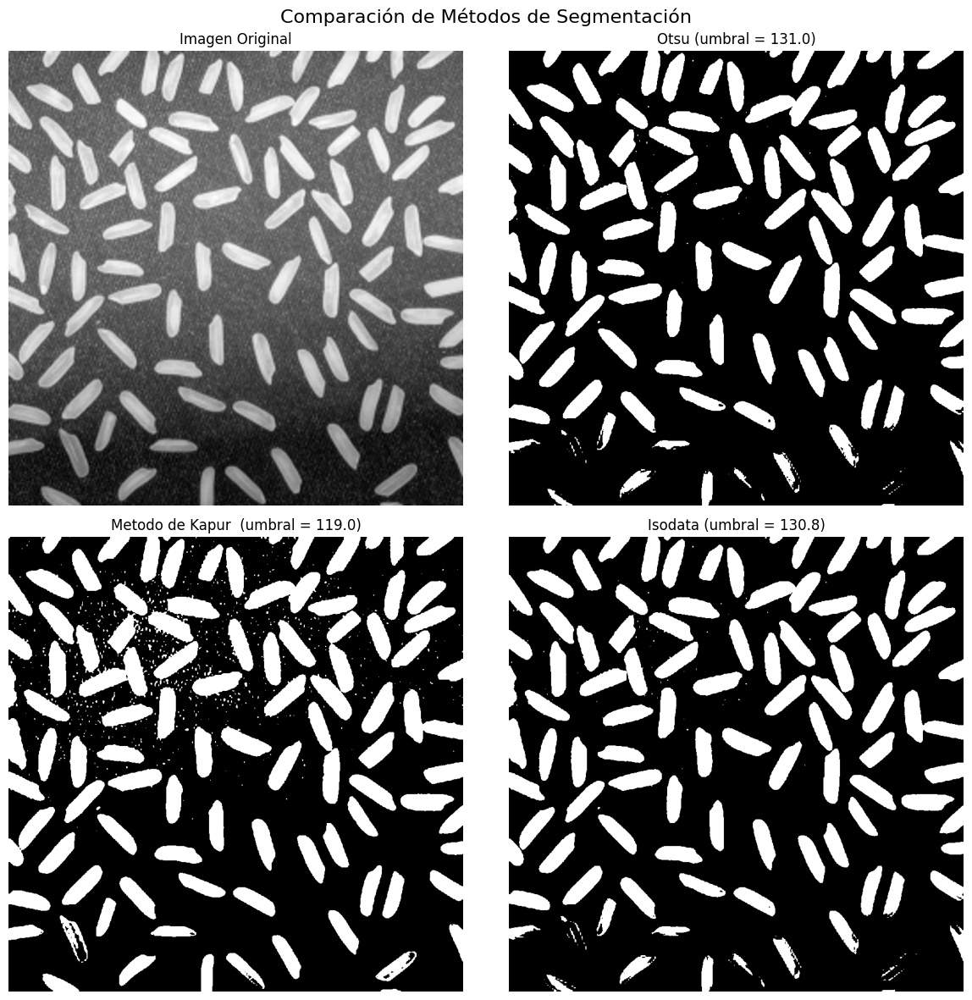

In [97]:
new_compare_segmentation_methods("res/rice.jpg")